In [69]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
from sklearn.metrics import accuracy_score , confusion_matrix , precision_score , recall_score, classification_report
from sklearn.metrics import average_precision_score

In [116]:
df = pd.read_excel('Dry_Bean_Dataset.xlsx')
print("Data Shape:",df.shape) 
df.head(10) 

Data Shape: (13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,30519,629.727,212.996755,182.737204,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


In [71]:
df.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [72]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [73]:
for column in df.columns:
    print(column,df[column].nunique())

Area 12011
Perimeter 13416
MajorAxisLength 13543
MinorAxisLength 13543
AspectRation 13543
Eccentricity 13543
ConvexArea 12066
EquivDiameter 12011
Extent 13535
Solidity 13526
roundness 13543
Compactness 13543
ShapeFactor1 13543
ShapeFactor2 13543
ShapeFactor3 13543
ShapeFactor4 13543
Class 7


In [74]:
df['Class'].value_counts()

DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: Class, dtype: int64

In [75]:
print(df.Class)

0           SEKER
1           SEKER
2           SEKER
3           SEKER
4           SEKER
           ...   
13606    DERMASON
13607    DERMASON
13608    DERMASON
13609    DERMASON
13610    DERMASON
Name: Class, Length: 13611, dtype: object


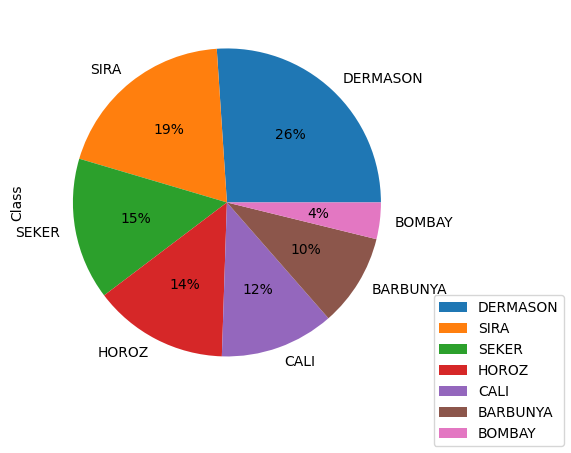

In [76]:
plt.figure(figsize=(7, 5))
pie = df.Class.value_counts().plot(kind='pie', autopct='%1.0f%%')
pie.figure.set_size_inches(7, 5)
pie.figure.legend(loc='lower right')
#plt.savefig("graphs/classdistribution.jpg")
plt.show()

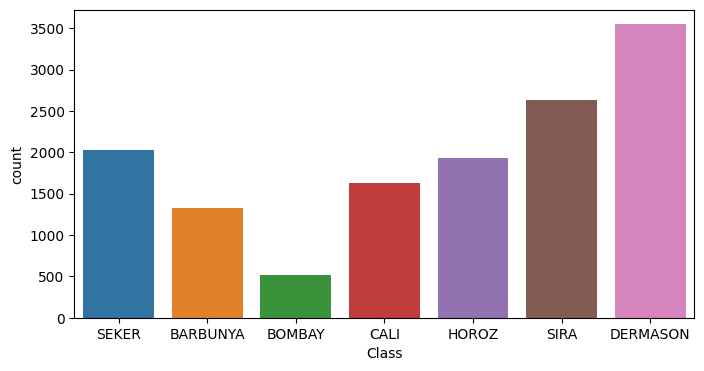

In [122]:
plt.figure(figsize=(8,4))
sns.countplot(x='Class',data=df)
plt.show()

In [77]:
features_na = [features for features in df.columns if df[features].isnull().sum() > 0]
for feature in features_na:
    print(feature, np.round(df[feature].isnull().mean(), 4),  ' % missing values')
else:
    print("No missing value")

No missing value


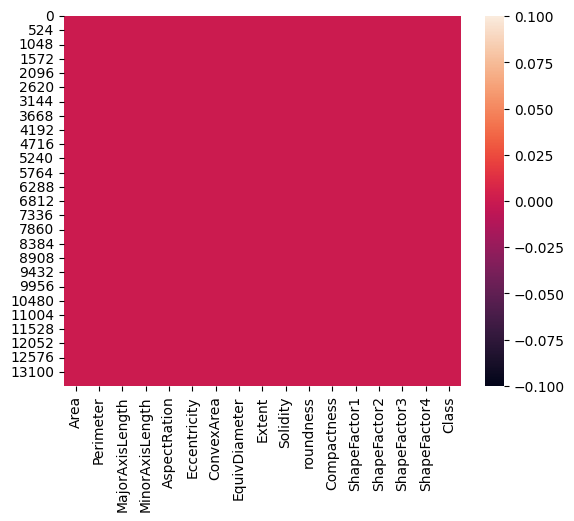

In [78]:
sns.heatmap(df.isnull())
plt.show()

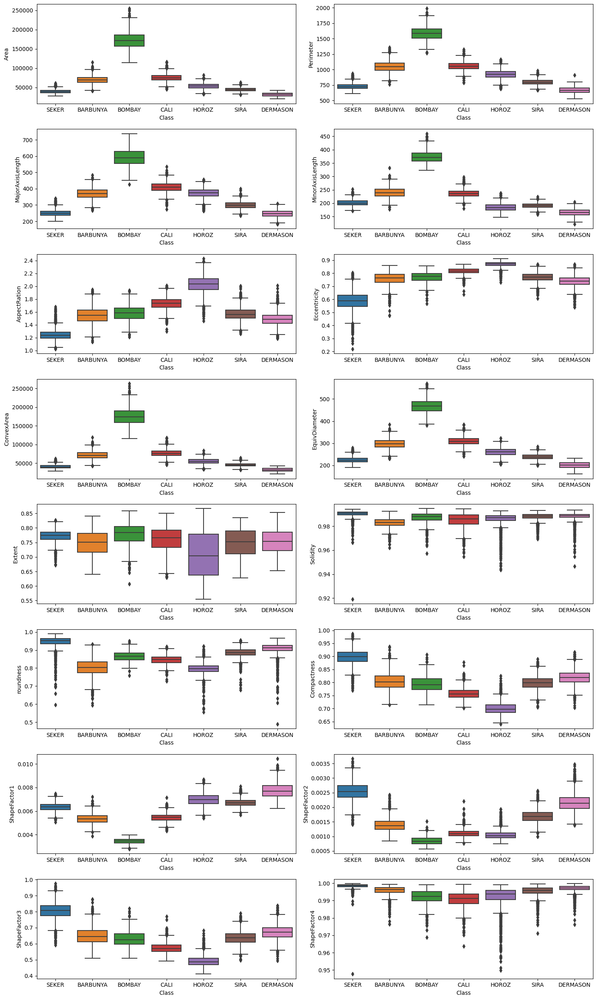

In [80]:
Numeric_cols = df.drop(columns=['Class']).columns
fig, ax = plt.subplots(8, 2, figsize=(15, 25))

for variable, subplot in zip(Numeric_cols, ax.flatten()):
    sns.boxplot(x=df['Class'], y= df[variable], ax=subplot)
plt.tight_layout()

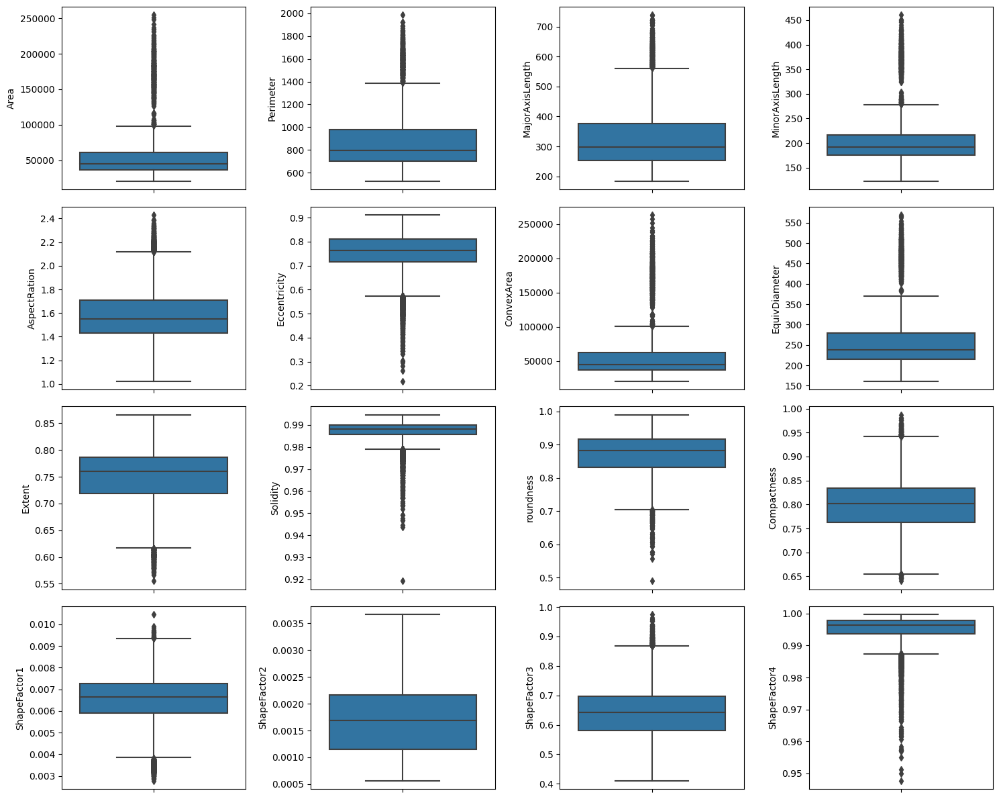

In [81]:
fig, ax = plt.subplots(4, 4, figsize=(15, 12))

for variable, subplot in zip(Numeric_cols, ax.flatten()):
    sns.boxplot(y= df[variable], ax=subplot)
plt.tight_layout()

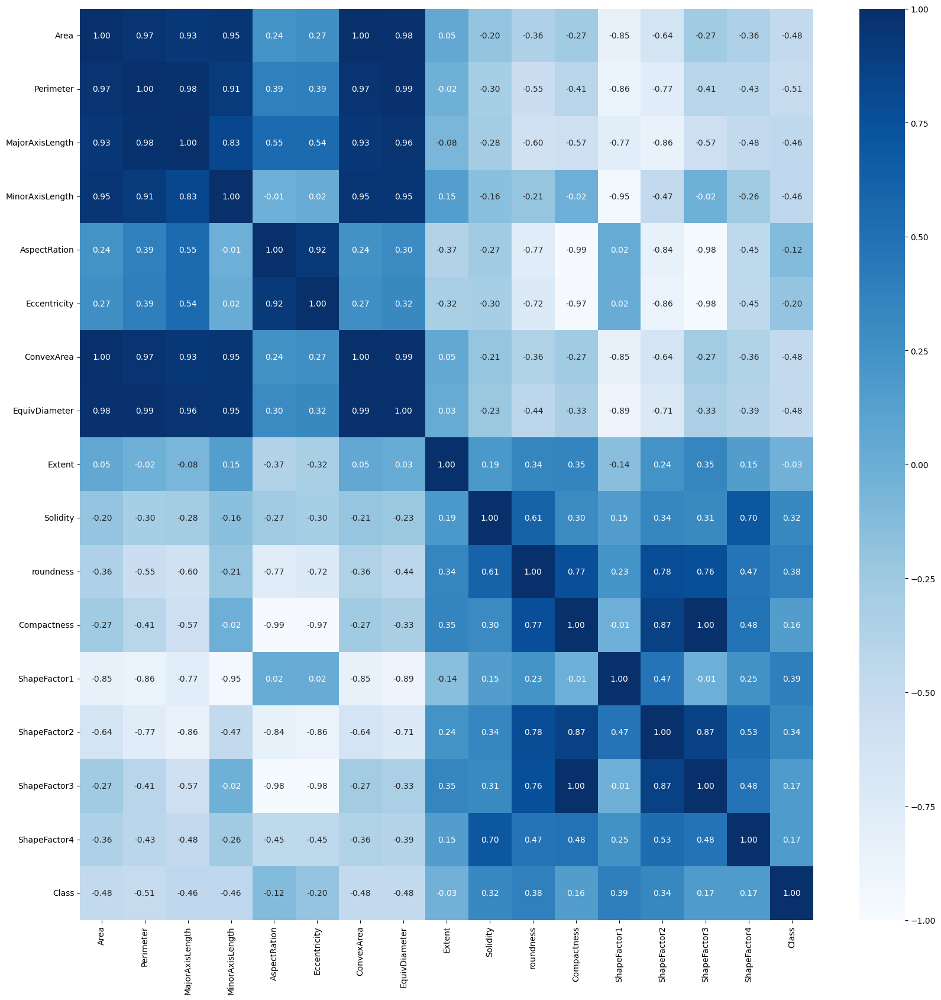

In [82]:
labelencoder = LabelEncoder()
#df['Class'] = labelencoder.fit_transform(df['Class'])
df.Class=labelencoder.fit_transform(df.Class)
df.head()

plt.figure(figsize = (20, 20))
sns.heatmap(df.corr(), 
            annot = True, 
            cmap = "Blues",
            fmt = ".2f",
            vmin = -1.00, vmax = 1.00)
plt.show()

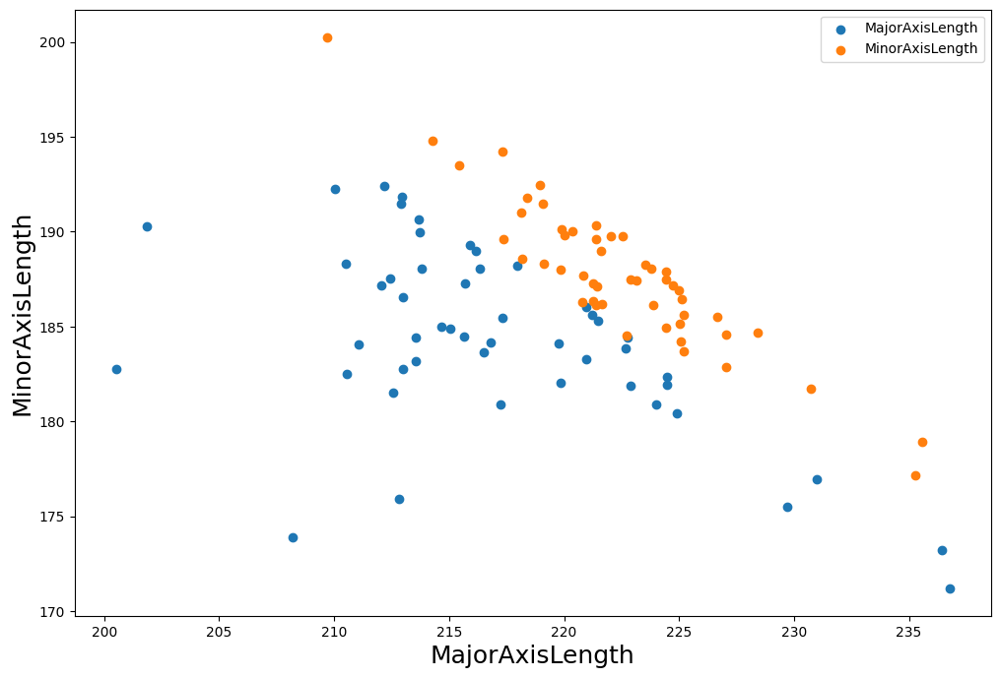

In [83]:

plt.figure(figsize=(12, 8))
plt.scatter(df[:50]['MajorAxisLength'], df[:50]['MinorAxisLength'], label='MajorAxisLength')
plt.scatter(df[50:100]['MajorAxisLength'], df[50:100]['MinorAxisLength'], label='MinorAxisLength')
plt.xlabel('MajorAxisLength', fontsize=18)
plt.ylabel('MinorAxisLength', fontsize=18)
plt.legend()

plt.show()

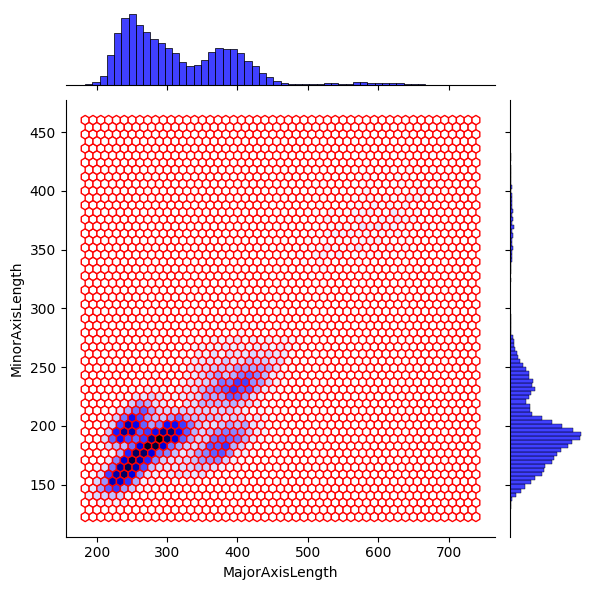

In [84]:
sns.jointplot(x='MajorAxisLength',y='MinorAxisLength',data=df,kind='hex',dropna=True,color="blue",edgecolor="red")
plt.show()

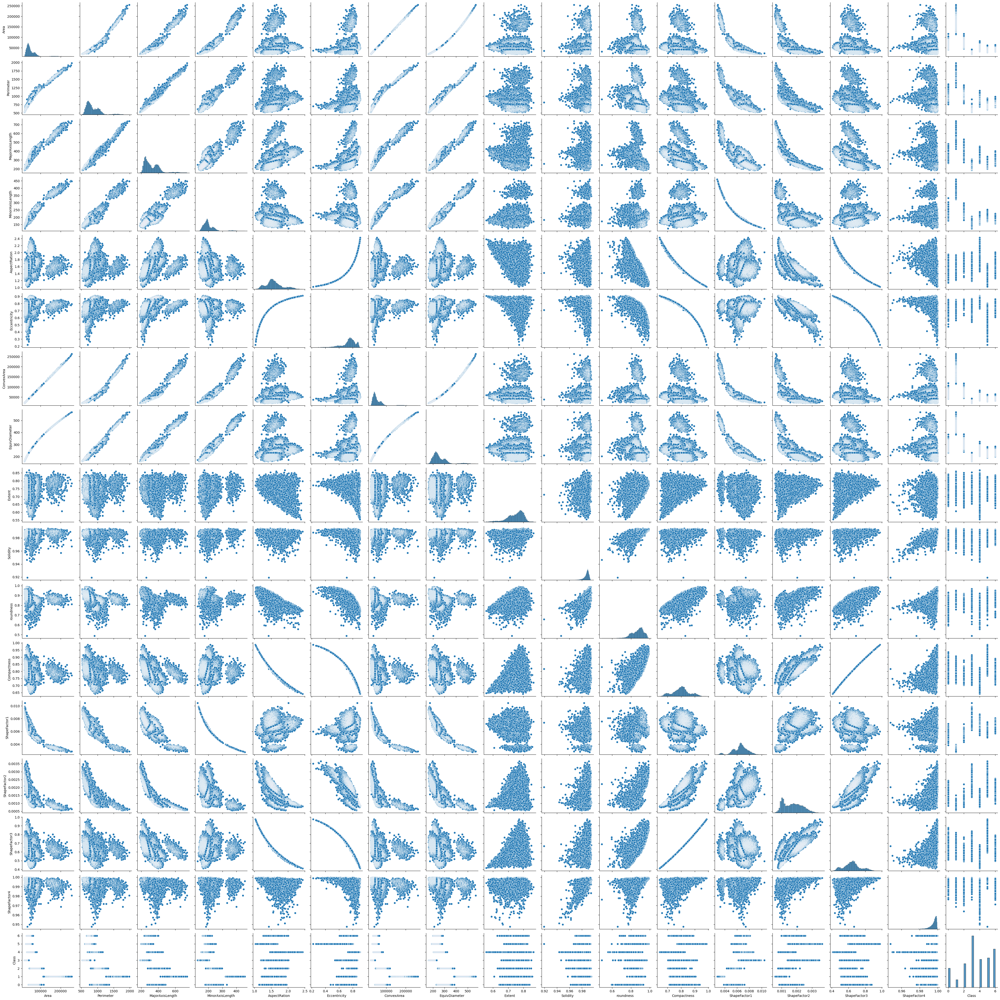

In [85]:
sns.pairplot(data=df)
plt.show()

In [121]:
# fig, axs = plt.subplots(ncols = 4, nrows = 4, figsize = (20, 20))
# index = 0

# axs = axs.flatten()
# for k, v in X.items():
#     sns.histplot(v, ax = axs[index])
#     index += 1
# plt.tight_layout(pad = 0.4, w_pad = 0.5, h_pad = 5.0)

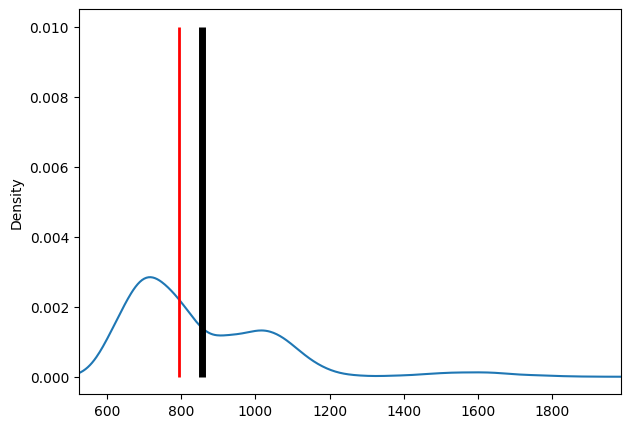

In [120]:
skewplot = df.Perimeter.plot(kind="density",
              figsize=(7,5),
              xlim=(df.Perimeter.min(),df.Perimeter.max()));
plt.vlines(df.Perimeter.mean(), 
           ymin=0, 
           ymax=0.01,
           linewidth=5.0,
           color="black");
plt.vlines(df.Perimeter.median(),
           ymin=0, 
           ymax=0.01, 
           linewidth=2.0,
           color="red");

plt.show()

C:\Users\Emma\AppData\Local\Temp\ipykernel_34340\2402943386.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  gender_correlation=df.corr()


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5]),
 [Text(0.5, 0, 'Area'),
  Text(1.5, 0, 'Perimeter'),
  Text(2.5, 0, 'MajorAxisLength'),
  Text(3.5, 0, 'MinorAxisLength'),
  Text(4.5, 0, 'AspectRation'),
  Text(5.5, 0, 'Eccentricity'),
  Text(6.5, 0, 'ConvexArea'),
  Text(7.5, 0, 'EquivDiameter'),
  Text(8.5, 0, 'Extent'),
  Text(9.5, 0, 'Solidity'),
  Text(10.5, 0, 'roundness'),
  Text(11.5, 0, 'Compactness'),
  Text(12.5, 0, 'ShapeFactor1'),
  Text(13.5, 0, 'ShapeFactor2'),
  Text(14.5, 0, 'ShapeFactor3'),
  Text(15.5, 0, 'ShapeFactor4')])

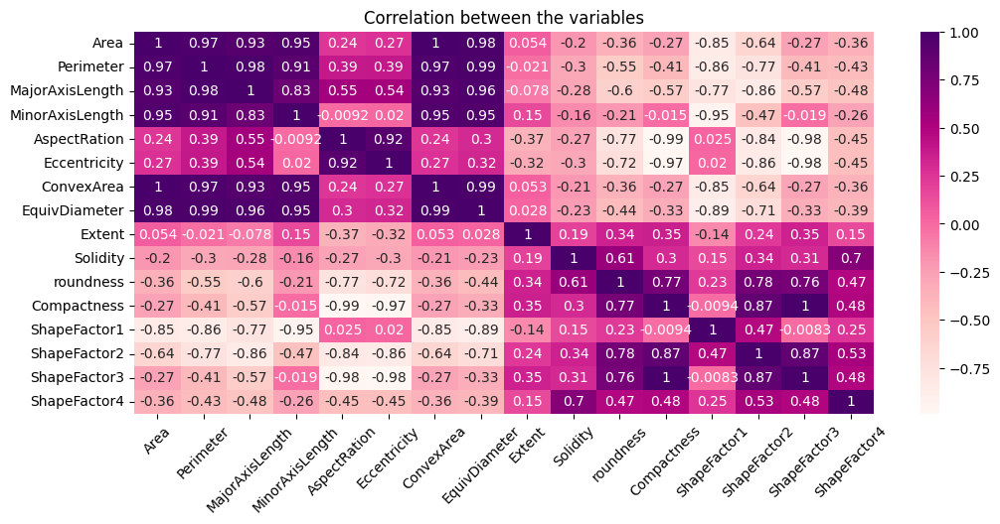

In [189]:
plt.subplots(figsize=(12,5))    #korelacija izmedju podataka
gender_correlation=df.corr()
sns.heatmap(gender_correlation,annot=True,cmap='RdPu')
plt.title('Correlation between the variables')
plt.xticks(rotation=45)

In [149]:
from sklearn.model_selection import train_test_split

data=df.values
X=data[:,0:16]
y=data[:,16]
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3)

print(f"Broj uzoraka u trening skupu podataka: {len(X_train)}")
print(f"Broj uzoraka u test skupu podataka: {len(X_test)}")

Broj uzoraka u trening skupu podataka: 9527
Broj uzoraka u test skupu podataka: 4084


## Linearni SVC

In [151]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split

svc_model = LinearSVC(random_state=0)

pred = svc_model.fit(X_train, y_train).predict(X_test)

print("LinearSVC accuracy : ",accuracy_score(y_test, pred, normalize = True))
report = classification_report(y_test,pred, digits=5)

LinearSVC accuracy :  0.6300195886385896


c:\Users\Emma\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\Emma\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Emma\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Emma\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344

## DECISION TREE

In [185]:
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

stdscalar=StandardScaler()
X_train=stdscalar.fit_transform(X_train)
X_test=stdscalar.transform(X_test)
dtree=DecisionTreeClassifier(ccp_alpha=0, criterion='entropy',
                       min_samples_split=3, random_state=0,max_depth=4)
dtree.fit(X_train,y_train)

DecisionTreeClassifier(ccp_alpha=0, criterion='entropy', max_depth=4,
                       min_samples_split=3, random_state=0)

In [186]:
from sklearn.metrics import accuracy_score
pred_dtree=dtree.predict(X_test)
accuracy_score(y_test,pred_dtree)

0.8648383937316356

              precision    recall  f1-score   support

    BARBUNYA       0.85      0.69      0.76       380
      BOMBAY       1.00      0.99      1.00       164
        CALI       0.82      0.87      0.84       509
    DERMASON       0.82      0.92      0.87      1024
       HOROZ       0.92      0.94      0.93       567
       SEKER       0.95      0.91      0.93       629
        SIRA       0.83      0.76      0.79       811

    accuracy                           0.86      4084
   macro avg       0.88      0.87      0.87      4084
weighted avg       0.87      0.86      0.86      4084



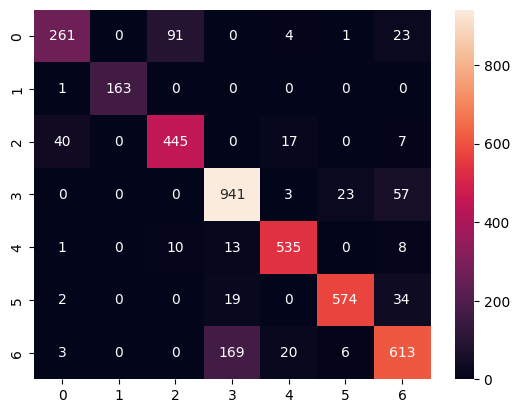

In [187]:
from sklearn.metrics import classification_report
cm=pd.DataFrame(confusion_matrix(y_test, pred_dtree))
sns.heatmap(cm, annot=True, fmt='d')
print(classification_report(y_test, pred_dtree))
plt.show()

In [181]:
# from sklearn.metrics import mean_absolute_error
# print("Mean Absolute error of decision tree",mean_absolute_error(y_test, pred_dtree))

[Text(0.5, 0.9, 'x[2] <= 0.108\nentropy = 2.643\nsamples = 9527\nvalue = [942, 358, 1121, 2522, 1361, 1398, 1825]'),
 Text(0.25, 0.7, 'x[3] <= -0.395\nentropy = 1.753\nsamples = 5823\nvalue = [103, 0, 3, 2522, 112, 1394, 1689]'),
 Text(0.125, 0.5, 'x[1] <= -0.699\nentropy = 0.892\nsamples = 2908\nvalue = [1, 0, 0, 2356, 104, 30, 417]'),
 Text(0.0625, 0.3, 'x[12] <= 0.431\nentropy = 0.224\nsamples = 1958\nvalue = [0, 0, 0, 1901, 2, 28, 27]'),
 Text(0.03125, 0.1, 'entropy = 1.185\nsamples = 51\nvalue = [0, 0, 0, 28, 0, 21, 2]'),
 Text(0.09375, 0.1, 'entropy = 0.148\nsamples = 1907\nvalue = [0, 0, 0, 1873, 2, 7, 25]'),
 Text(0.1875, 0.3, 'x[14] <= -0.946\nentropy = 1.411\nsamples = 950\nvalue = [1, 0, 0, 455, 102, 2, 390]'),
 Text(0.15625, 0.1, 'entropy = 0.323\nsamples = 85\nvalue = [0, 0, 0, 0, 80, 0, 5]'),
 Text(0.21875, 0.1, 'entropy = 1.174\nsamples = 865\nvalue = [1, 0, 0, 455, 22, 2, 385]'),
 Text(0.375, 0.5, 'x[11] <= 0.888\nentropy = 1.473\nsamples = 2915\nvalue = [102, 0, 3, 166

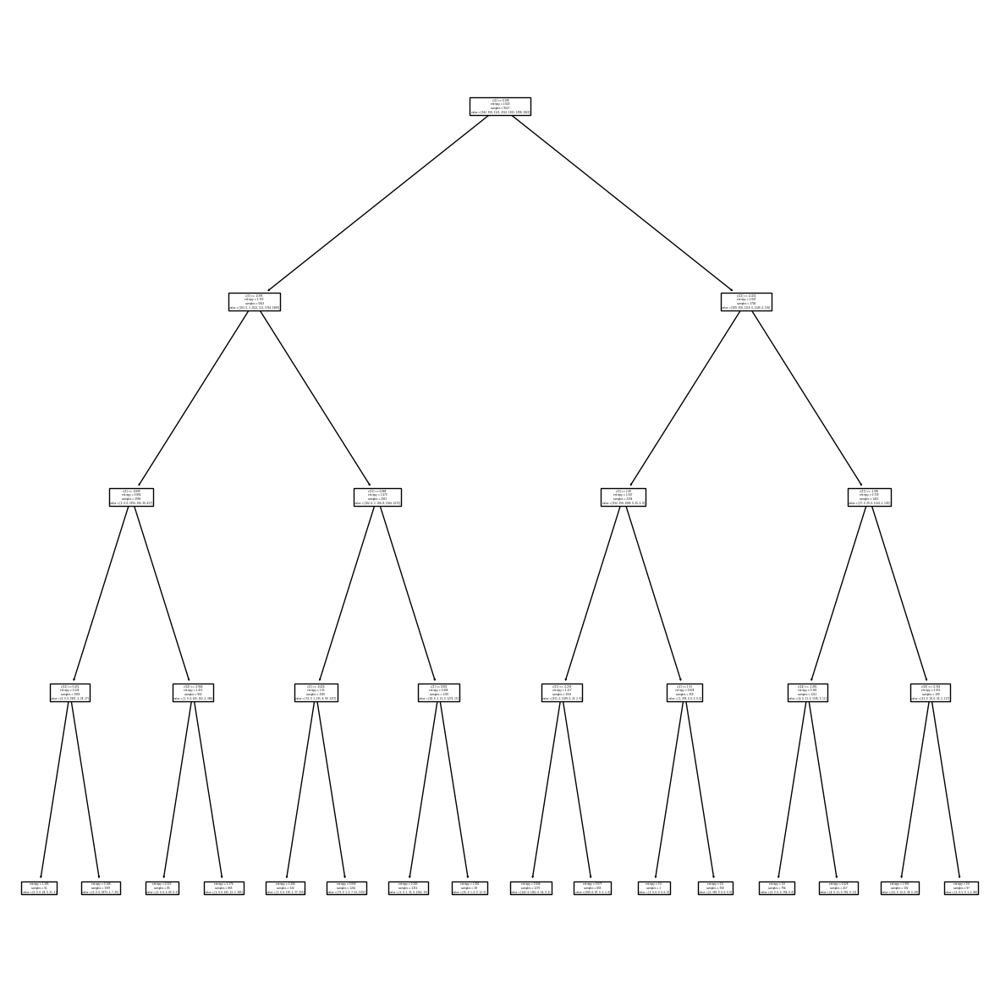

In [188]:
plt.figure(figsize=(15,15))
from sklearn import tree
tree.plot_tree(dtree)

## RANDOM FOREST

In [161]:
from sklearn.ensemble import RandomForestClassifier
rfe=RandomForestClassifier()
rfe.fit(X_train,y_train)

RandomForestClassifier()

In [162]:
pred_rfe=rfe.predict(X_test)
accuracy_score(y_test,pred_rfe)

0.9262977473065622

              precision    recall  f1-score   support

    BARBUNYA       0.93      0.92      0.92       380
      BOMBAY       1.00      1.00      1.00       164
        CALI       0.94      0.92      0.93       509
    DERMASON       0.92      0.93      0.92      1024
       HOROZ       0.95      0.93      0.94       567
       SEKER       0.94      0.96      0.95       629
        SIRA       0.88      0.88      0.88       811

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



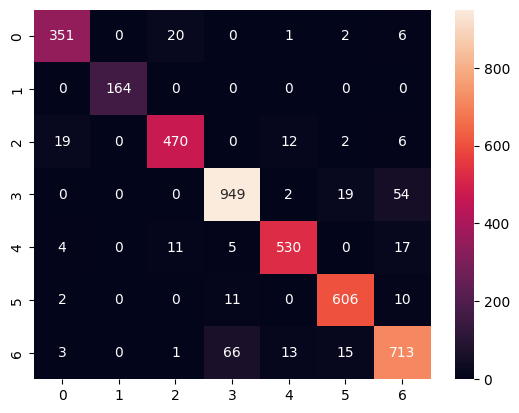

In [165]:
con=pd.DataFrame(confusion_matrix(y_test, pred_rfe))
sns.heatmap(con, annot=True, fmt='d')
print(classification_report(y_test, pred_rfe))
plt.show()

In [ ]:
#importances = rfe.feature_importances_
#indices = np.argsort(importances)[::-1]
#columns=['BARBUNYA','BOMBAY' ,'CALI', 'DERMASON', 'HOROZ', 'SEKER', 'SIRA']
#names = [X.columns[i] for i in indices]
 
#plt.figure()
 
#plt.title("Feature Importance")
 
#plt.bar(range(X_train.shape[1]), importances[indices])
 
#plt.xticks(range(X_train.shape[1]), names, rotation=90)
 
#plt.show()

## SVM

In [166]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler  
from sklearn.preprocessing import MinMaxScaler 

np.set_printoptions(edgeitems=127)

stdscaler=StandardScaler()  
X_train=stdscaler.fit_transform(X_train)
X_test=stdscaler.transform(X_test)

svm = SVC(C=10,kernel='rbf', gamma=0.1)
svm.fit(X_train,y_train)

SVC(C=10, gamma=0.1)

In [167]:
predict=svm.predict(X_test)
print(accuracy_score(y_test,predict))

0.9338883447600391


In [191]:
# from sklearn.metrics import mean_absolute_error

# print(mean_absolute_error(y_test,predict))

              precision    recall  f1-score   support

    BARBUNYA       0.94      0.94      0.94       380
      BOMBAY       1.00      1.00      1.00       164
        CALI       0.95      0.94      0.94       509
    DERMASON       0.92      0.93      0.93      1024
       HOROZ       0.95      0.94      0.94       567
       SEKER       0.96      0.97      0.96       629
        SIRA       0.89      0.89      0.89       811

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



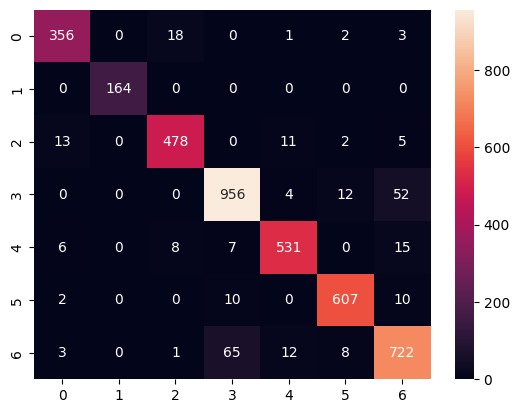

In [168]:
cm=pd.DataFrame(confusion_matrix(y_test, predict))
sns.heatmap(cm, annot=True, fmt='d')
print(classification_report(y_test, predict))
plt.show()

## LOGISTIC REGRESSION

In [169]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

lr=LogisticRegression(C=10)
stdscalar=StandardScaler()
X_train=stdscalar.fit_transform(X_train)
X_test=stdscalar.transform(X_test)

lr.fit(X_train,y_train)

c:\Users\Emma\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(C=10)

In [170]:
lr.score(X_test, y_test)

0.9294809010773751

In [171]:
predictions=lr.predict(X_test)
accuracy_score(y_test,predictions)

0.9294809010773751

In [ ]:
from sklearn.metrics import mean_absolute_error

print(mean_absolute_error(y_test,predict))

0.17164544564152792


              precision    recall  f1-score   support

    BARBUNYA       0.95      0.92      0.93       380
      BOMBAY       1.00      1.00      1.00       164
        CALI       0.94      0.94      0.94       509
    DERMASON       0.93      0.92      0.92      1024
       HOROZ       0.96      0.94      0.95       567
       SEKER       0.95      0.96      0.96       629
        SIRA       0.87      0.90      0.88       811

    accuracy                           0.93      4084
   macro avg       0.94      0.94      0.94      4084
weighted avg       0.93      0.93      0.93      4084



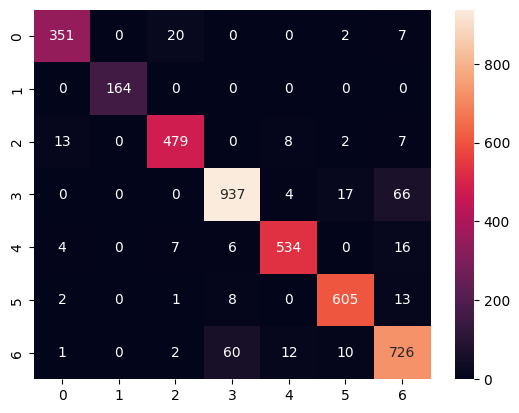

In [172]:
cm=pd.DataFrame(confusion_matrix(y_test, predictions))
sns.heatmap(cm, annot=True, fmt='d')
print(classification_report(y_test, predictions))
plt.show()

## NAIVE BAYES CLASSIFIER

In [173]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(X_train,y_train)

GaussianNB()

In [174]:
pred_nb=gnb.predict(X_test)
accuracy_score(y_test,pred_nb)

0.9008325171400587

              precision    recall  f1-score   support

    BARBUNYA       0.87      0.83      0.85       380
      BOMBAY       1.00      1.00      1.00       164
        CALI       0.88      0.90      0.89       509
    DERMASON       0.93      0.87      0.90      1024
       HOROZ       0.94      0.94      0.94       567
       SEKER       0.93      0.95      0.94       629
        SIRA       0.83      0.89      0.86       811

    accuracy                           0.90      4084
   macro avg       0.91      0.91      0.91      4084
weighted avg       0.90      0.90      0.90      4084



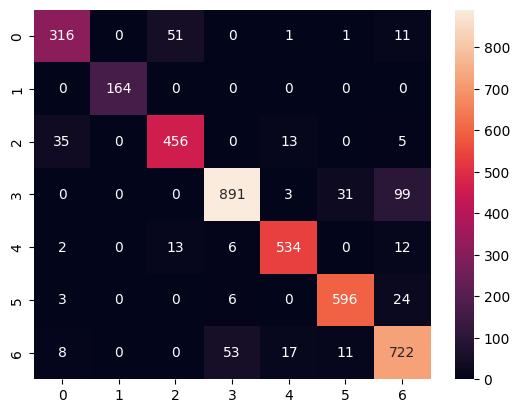

In [176]:
conm=pd.DataFrame(confusion_matrix(y_test, pred_nb))
sns.heatmap(conm, annot=True, fmt='d')
print(classification_report(y_test, pred_nb))
plt.show()

## KNN

In [177]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(X)
X_scaled = scaler.transform(X)

In [178]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.neighbors import KNeighborsClassifier

knn_clf_sk_3 = KNeighborsClassifier(n_neighbors=3)
knn_clf_sk_3.fit(X_train, y_train)
knn_clf_sk_3.score(X_test, y_test)

0.9223800195886386

KNeighbors accuracy :  0.9223800195886386
              precision    recall  f1-score   support

    BARBUNYA       0.92      0.92      0.92       380
      BOMBAY       1.00      1.00      1.00       164
        CALI       0.94      0.94      0.94       509
    DERMASON       0.91      0.91      0.91      1024
       HOROZ       0.95      0.94      0.95       567
       SEKER       0.96      0.95      0.95       629
        SIRA       0.86      0.88      0.87       811

    accuracy                           0.92      4084
   macro avg       0.94      0.93      0.93      4084
weighted avg       0.92      0.92      0.92      4084



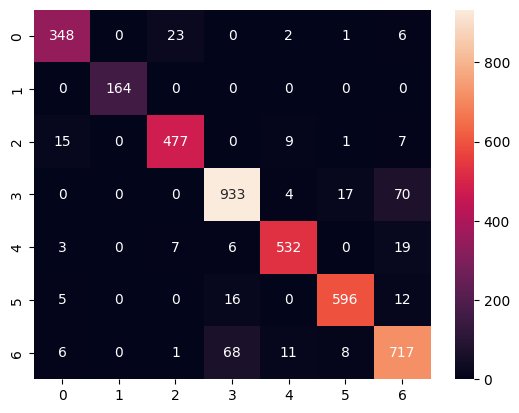

In [179]:
nnModel = knn_clf_sk_3.fit(X_train, y_train)

predNN = nnModel.predict(X_test)

print("KNeighbors accuracy : ",accuracy_score(y_test, predNN, normalize = True))

conm=pd.DataFrame(confusion_matrix(y_test, predNN))
sns.heatmap(conm, annot=True, fmt='d')
print(classification_report(y_test, predNN))
plt.show()

## Poredjenje rezultata

In [180]:
print('Decision tree: ',(dtree.score(X_test, y_test)*100), '%')
print('\n')
print('KNN: ',(knn_clf_sk_3.score(X_test, y_test)*100),'%')
print('\n')
print('Random Forest: ', (rfe.score(X_test, y_test)*100),'%')
print('\n')
print('Naive Bayes Classifier: ', (gnb.score(X_test, y_test)*100),'%')
print('\n')
print('Logistic Regresion: ', (lr.score(X_test, y_test)*100),'%')
print('\n')
print('SVM: ', (svm.score(X_test, y_test)*100),'%')

Decision tree:  86.48383937316356 %


KNN:  92.23800195886386 %


Random Forest:  92.62977473065622 %


Naive Bayes Classifier:  90.08325171400587 %


Logistic Regresion:  92.94809010773751 %


SVM:  93.38883447600391 %
